In [5]:
# Import librarires
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt

# Sklearn moduels.
from sklearn.model_selection import train_test_split

In [6]:
apple_data = pd.read_csv('/Users/aierkenailifeili/Desktop/AppleStore.csv')


In [7]:
apple_data.head()

,Unnamed: 0,id,track_name,size_bytes,currency,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,1,281656475,PAC-MAN Premium,100788224,USD,3.99,21292,26,4.0,4.5,6.3.5,4+,Games,38,5,10,1
1,2,281796108,Evernote - stay organized,158578688,USD,0.00,161065,26,4.0,3.5,8.2.2,4+,Productivity,37,5,23,1
2,3,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,USD,0.00,188583,2822,3.5,4.5,5.0.0,4+,Weather,37,5,3,1
3,4,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,USD,0.00,262241,649,4.0,4.5,5.10.0,12+,Shopping,37,5,9,1
4,5,282935706,Bible,92774400,USD,0.00,985920,5320,4.5,5.0,7.5.1,4+,Reference,37,5,45,1


In [8]:
apple_data.info()  #explore the format of the data, we have 7196 observations and 17 columns. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7197 entries, 0 to 7196
Data columns (total 17 columns):
Unnamed: 0          7197 non-null int64
id                  7197 non-null int64
track_name          7197 non-null object
size_bytes          7197 non-null int64
currency            7197 non-null object
price               7197 non-null float64
rating_count_tot    7197 non-null int64
rating_count_ver    7197 non-null int64
user_rating         7197 non-null float64
user_rating_ver     7197 non-null float64
ver                 7197 non-null object
cont_rating         7197 non-null object
prime_genre         7197 non-null object
sup_devices.num     7197 non-null int64
ipadSc_urls.num     7197 non-null int64
lang.num            7197 non-null int64
vpp_lic             7197 non-null int64
dtypes: float64(3), int64(9), object(5)
memory usage: 955.9+ KB


In [59]:
# Get the mean and standard deviation of any numerical data fields
apple_data.describe()

,Unnamed: 0,id,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
count,7197.000000,7.197000e+03,7.197000e+03,7197.000000,7.197000e+03,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000
mean,4759.069612,8.631310e+08,1.991345e+08,1.726218,1.289291e+04,460.373906,3.526956,3.253578,37.361817,3.707100,5.434903,0.993053
std,3093.625213,2.712368e+08,3.592069e+08,5.833006,7.573941e+04,3920.455183,1.517948,1.809363,3.737715,1.986005,7.919593,0.083066
min,1.000000,2.816565e+08,5.898240e+05,0.000000,0.000000e+00,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000
25%,2090.000000,6.000937e+08,4.692275e+07,0.000000,2.800000e+01,1.000000,3.500000,2.500000,37.000000,3.000000,1.000000,1.000000
50%,4380.000000,9.781482e+08,9.715302e+07,0.000000,3.000000e+02,23.000000,4.000000,4.000000,37.000000,5.000000,1.000000,1.000000
75%,7223.000000,1.082310e+09,1.819249e+08,1.990000,2.793000e+03,140.000000,4.500000,4.500000,38.000000,5.000000,8.000000,1.000000
max,11097.000000,1.188376e+09,4.025970e+09,299.990000,2.974676e+06,177050.000000,5.000000,5.000000,47.000000,5.000000,75.000000,1.000000


Text(0.5, 0, 'User rating distribution ')

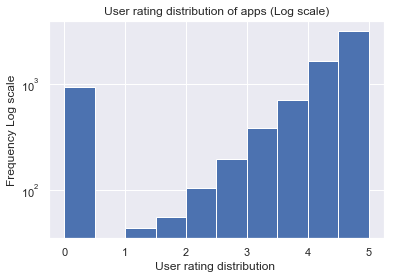

In [60]:
plt.hist(apple_data.user_rating,log=True,)
plt.title('User rating distribution of apps (Log scale)')
plt.ylabel("Frequency Log scale")
plt.xlabel("User rating distribution ")


Text(0.5, 0, 'Price Distributions in ($) ')

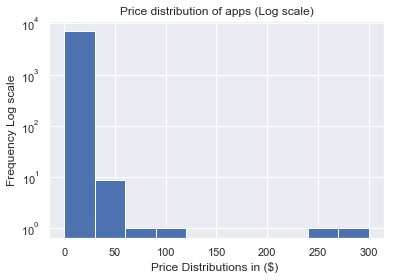

In [61]:
plt.hist(apple_data.price,log=True,)
plt.title('Price distribution of apps (Log scale)')
plt.ylabel("Frequency Log scale")
plt.xlabel("Price Distributions in ($) ")

Text(0.5, 0, 'Size bytes distribution ')

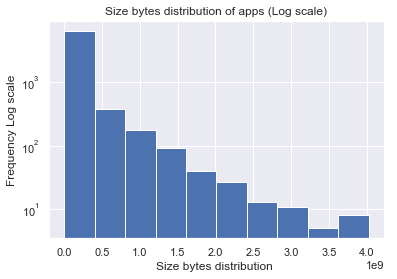

In [62]:
plt.hist(apple_data.size_bytes,log=True)
plt.title('Size bytes distribution of apps (Log scale)')
plt.ylabel("Frequency Log scale")
plt.xlabel("Size bytes distribution ")


In [4]:
plt.hist(apple_data.cont_rating,log=True)
plt.title('Content Rating distribution of apps (Log scale)')
plt.ylabel("Frequency Log scale")
plt.xlabel("Content Rating distribution ")


NameError: name 'apple_data' is not defined

In [2]:
plt.hist(apple_data.sup_devices_num,log=True)
plt.title('Support devices distribution of apps (Log scale)')
plt.ylabel("Frequency Log scale")
plt.xlabel("sup_devices distribution ")


NameError: name 'plt' is not defined

In [ ]:
categories = apple_data.prime_genre.value_counts()
plt.figure(figsize=(20,10))
sns.barplot(x=categories[:24].index,y=categories[:24].values)
plt.ylabel('App')
plt.xlabel('Categories')
plt.title('Genre counts by catogories',fontsize=3)   # all apps categories.

Data Pre-processing

In [7]:
#there is column named unnamed in the table when we chek the data info. we need to delete that column, at the same time we need to
#delete id, currency, vpp_lic variables

df = apple_data.drop(columns = ['Unnamed: 0','id','currency'])
# Another solution for delete index: apple_data = apple_data.iloc[:,1:]  #there is column named unnamed in the table when we chek the data info. we need to delete that column. 

# Remove the '+' from the rating and change dtype to int
df['cont_rating'] = (df['cont_rating']
                    .apply   (lambda x: x.replace('+',''))
                    .astype  (int))
df.head()

,track_name,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,PAC-MAN Premium,100788224,3.99,21292,26,4.0,4.5,6.3.5,4,Games,38,5,10,1
1,Evernote - stay organized,158578688,0.00,161065,26,4.0,3.5,8.2.2,4,Productivity,37,5,23,1
2,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,0.00,188583,2822,3.5,4.5,5.0.0,4,Weather,37,5,3,1
3,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,0.00,262241,649,4.0,4.5,5.10.0,12,Shopping,37,5,9,1
4,Bible,92774400,0.00,985920,5320,4.5,5.0,7.5.1,4,Reference,37,5,45,1


In [8]:
df.describe(include = ['O'])

,track_name,ver,prime_genre
count,7197,7197,7197
unique,7195,1590,23
top,Mannequin Challenge,1.0,Games
freq,2,317,3862


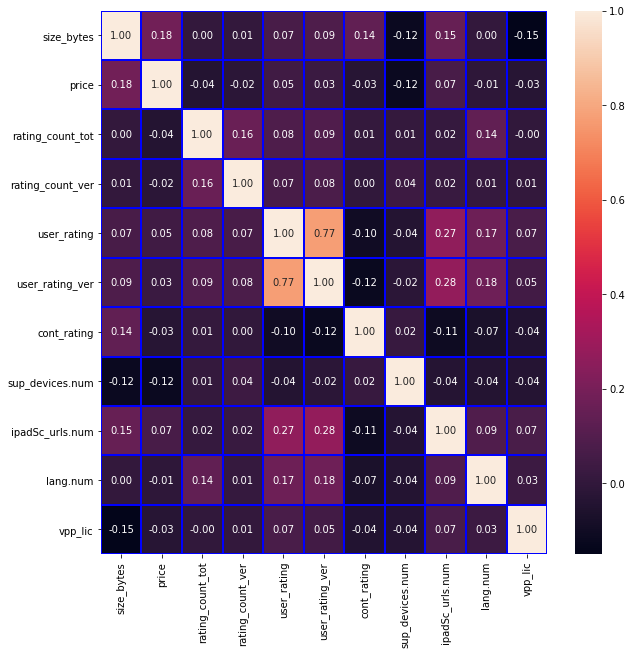

In [9]:
df.corr()
plt.subplots(figsize=(10,10))
sns.heatmap(df.corr(), annot=True, linewidths=1,linecolor="blue", fmt=".2f")
plt.show()

In [10]:
#add a new coloumns based on the existing one.
df['size_bytes_in_MB'] = df['size_bytes'] / (1024 * 1024.0)  
df['rating_count_before'] = df['rating_count_tot'] - df['rating_count_ver']
df['isFree'] = df['price'].apply(lambda x: 0 if x > 0 else 1)

(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

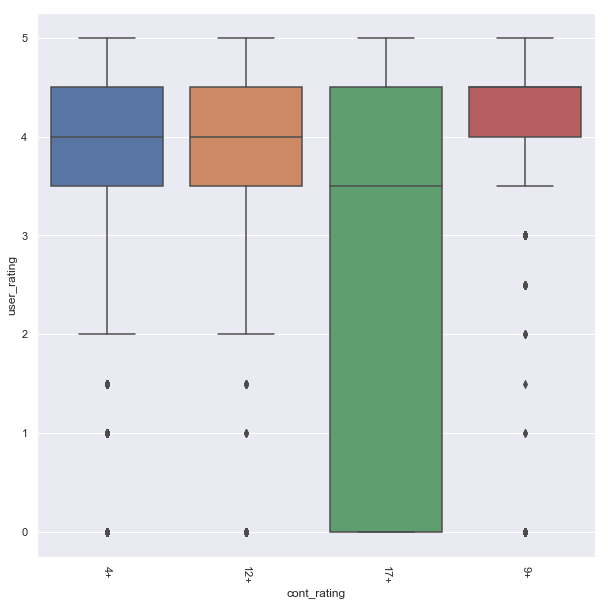

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()
plt.figure(figsize=(10,10))
sns.boxplot(data=apple_data, x="cont_rating", y="user_rating")
plt.xticks(rotation=-90)

In [11]:
df

,track_name,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic,size_bytes_in_MB,rating_count_before,isFree
0,PAC-MAN Premium,100788224,3.99,21292,26,4.0,4.5,6.3.5,4,Games,38,5,10,1,96.119141,21266,0
1,Evernote - stay organized,158578688,0.00,161065,26,4.0,3.5,8.2.2,4,Productivity,37,5,23,1,151.232422,161039,1
2,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,0.00,188583,2822,3.5,4.5,5.0.0,4,Weather,37,5,3,1,95.867188,185761,1
3,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,0.00,262241,649,4.0,4.5,5.10.0,12,Shopping,37,5,9,1,122.558594,261592,1
4,Bible,92774400,0.00,985920,5320,4.5,5.0,7.5.1,4,Reference,37,5,45,1,88.476562,980600,1
5,Shanghai Mahjong,10485713,0.99,8253,5516,4.0,4.0,1.8,4,Games,47,5,1,1,9.999955,2737,0
6,PayPal - Send and request money safely,227795968,0.00,119487,879,4.0,4.5,6.12.0,4,Finance,37,0,19,1,217.243164,118608,1
7,Pandora - Music & Radio,130242560,0.00,1126879,3594,4.0,4.5,8.4.1,12,Music,37,4,1,1,124.208984,1123285,1
8,PCalc - The Best Calculator,49250304,9.99,1117,4,4.5,5.0,3.6.6,4,Utilities,37,5,1,1,46.968750,1113,0
9,Ms. PAC-MAN,70023168,3.99,7885,40,4.0,4.0,4.0.4,4,Games,38,0,10,1,66.779297,7845,0


In [12]:
# create new column named bin, depending on the exsiting data named user_rating.
df['bin'] = np.where(df['user_rating']>=3.5, 1,0)


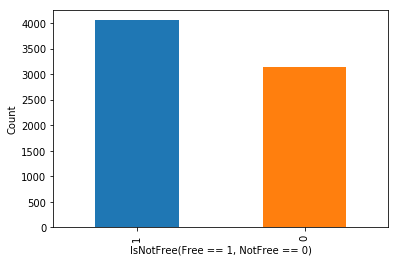

In [13]:
#price is different variety of apps,our analysis is only focus on the free app. here is the counting chart based on the price.
df['isFree'].value_counts().plot.bar()
plt.xlabel('IsNotFree(Free == 1, NotFree == 0)')
plt.ylabel('Count')
plt.show()

/Users/aierkenailifeili/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


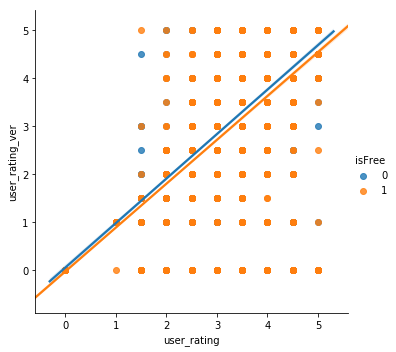

In [14]:
sns.lmplot(x='user_rating', y='user_rating_ver', hue='isFree', data=df)

In [16]:
import matplotlib.pyplot as plt

x = df['price']

df.price.value_counts()

df = df[df['price'] == 0]  #keep the data with free apps which means price is 0. 
df = df[df['user_rating']> 0]  # keep the data with have user rating, which means, remove the dataset with have no user rating.


In [17]:
df.count()

track_name             3383
size_bytes             3383
price                  3383
rating_count_tot       3383
rating_count_ver       3383
user_rating            3383
user_rating_ver        3383
ver                    3383
cont_rating            3383
prime_genre            3383
sup_devices.num        3383
ipadSc_urls.num        3383
lang.num               3383
vpp_lic                3383
size_bytes_in_MB       3383
rating_count_before    3383
isFree                 3383
bin                    3383
dtype: int64

In [18]:
#df1 = apple_data.drop(columns = ['Unnamed: 0','id','currency'])

In [19]:
def df_categorizer(rating):
    if rating >= 100000:
        return 2
    elif rating < 10000:
        return 0
    else:
        return 1

In [20]:
df['pop_categories'] = df['rating_count_tot'].apply(df_categorizer)

finalDf = df[['size_bytes_in_MB','rating_count_tot','pop_categories','user_rating']]
finalDf.groupby(['user_rating']).mean()

,size_bytes_in_MB,rating_count_tot,pop_categories
user_rating,,,
1.0,91.501302,6.666667,0.000000
1.5,70.140186,279.692308,0.000000
2.0,81.196306,5334.228070,0.070175
2.5,89.053178,8463.134454,0.109244
3.0,106.235618,12958.000000,0.175926
3.5,125.808555,26348.462567,0.245989
4.0,162.116480,12642.148235,0.187059
4.5,172.844244,34861.869625,0.428669
5.0,120.708165,16921.231373,0.258824


In [21]:
df.head()

,track_name,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic,size_bytes_in_MB,rating_count_before,isFree,bin,pop_categories
1,Evernote - stay organized,158578688,0.0,161065,26,4.0,3.5,8.2.2,4,Productivity,37,5,23,1,151.232422,161039,1,1,2
2,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,0.0,188583,2822,3.5,4.5,5.0.0,4,Weather,37,5,3,1,95.867188,185761,1,1,2
3,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,0.0,262241,649,4.0,4.5,5.10.0,12,Shopping,37,5,9,1,122.558594,261592,1,1,2
4,Bible,92774400,0.0,985920,5320,4.5,5.0,7.5.1,4,Reference,37,5,45,1,88.476562,980600,1,1,2
6,PayPal - Send and request money safely,227795968,0.0,119487,879,4.0,4.5,6.12.0,4,Finance,37,0,19,1,217.243164,118608,1,1,2


In [22]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [23]:
#split dataset in features and target variable
df_cols = ['size_bytes_in_MB','pop_categories','rating_count_tot']
X = df[df_cols] # Features
y = df.bin # Target variable


In [24]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [25]:
 #Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [26]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7842364532019704


In [28]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = df_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

In [29]:
# Optimizing decision tree: 


# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.865024630541872


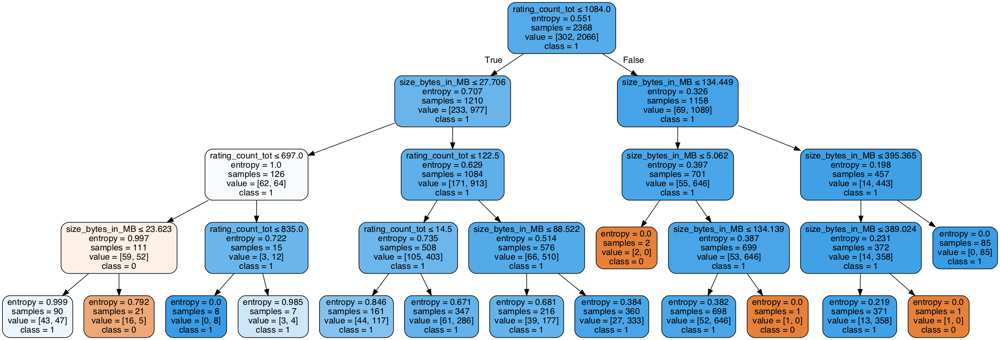

In [30]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()      #export_graphviz function converts decision tree classifier into dot file and pydotplus convert this dot file to png or displayable form on Jupyter.
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = df_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

In [31]:
import os
import numpy as np
import pandas as pd
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree

In [32]:
df['bin'],class_names = pd.factorize(df['bin'])

In [33]:
print(class_names)
print(df['bin'].unique())


Int64Index([1, 0], dtype='int64')
[0 1]


In [34]:
df['size_bytes_in_MB'],_ = pd.factorize(df['size_bytes_in_MB'])
df['rating_count_tot'],_ = pd.factorize(df['rating_count_tot'])
df.head()

,track_name,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic,size_bytes_in_MB,rating_count_before,isFree,bin,pop_categories
1,Evernote - stay organized,158578688,0.0,0,26,4.0,3.5,8.2.2,4,Productivity,37,5,23,1,0,161039,1,0,2
2,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,0.0,1,2822,3.5,4.5,5.0.0,4,Weather,37,5,3,1,1,185761,1,0,2
3,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,0.0,2,649,4.0,4.5,5.10.0,12,Shopping,37,5,9,1,2,261592,1,0,2
4,Bible,92774400,0.0,3,5320,4.5,5.0,7.5.1,4,Reference,37,5,45,1,3,980600,1,0,2
6,PayPal - Send and request money safely,227795968,0.0,4,879,4.0,4.5,6.12.0,4,Finance,37,0,19,1,4,118608,1,0,2


In [35]:
df_cols = ['size_bytes_in_MB']
X = df[df_cols] # Features
y = df.bin # Target variable

In [36]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [37]:
# train the decision tree
## Instantiate the model with 5 neighbors. 
model = KNeighborsClassifier(n_neighbors=5)
## Fit the model on the training data.
model.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

In [38]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)
y_pred = knn.predict(X)
print(metrics.accuracy_score(y, y_pred))

0.8944723618090452


In [40]:
from sklearn.model_selection import cross_validate
from sklearn import svm
model = KNeighborsClassifier(n_neighbors = 50)
#model = svm.SVC(C=4, kernel='linear',probability=True,gamma=15)
cv_results = cross_validate(model, X_train, y_train, cv=3, scoring='roc_auc',return_train_score=False)
cv_results

{'fit_time': array([0.00576806, 0.00459814, 0.0044508 ]),
 'score_time': array([0.01401711, 0.01416492, 0.02158427]),
 'test_score': array([0.54876489, 0.57410654, 0.55411337])}

In [41]:
df['pop_categories'] = df['rating_count_tot'].apply(df_categorizer)

df1 = df[['size_bytes_in_MB', 'rating_count_tot', 'pop_categories','bin','rating_count_ver']]
df1.groupby(['bin']).mean()

,size_bytes_in_MB,rating_count_tot,pop_categories,rating_count_ver
bin,,,,
0,1692.697351,1060.617188,0.0,751.842052
1,1586.938497,724.453303,0.0,218.831435


Random Forest Classification 



In [42]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.externals import joblib
from sklearn.metrics import accuracy_score

In [43]:
X=df[['size_bytes_in_MB']]
y=df['bin']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 10)

In [44]:
npX_train = np.array(X_train)
npX_train = npX_train.reshape(-1,1)

npX_test = np.array(X_test)
npX_test = npX_test.reshape(-1,1)

In [45]:
scaler = StandardScaler()

npX_train = scaler.fit_transform(npX_train)
npX_test = scaler.transform(npX_test)

/Users/aierkenailifeili/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/aierkenailifeili/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/aierkenailifeili/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [46]:
classifier = RandomForestClassifier(n_estimators = 3, criterion='entropy', random_state=10)
classifier.fit(npX_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=3, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

In [47]:
# Predicting the Test set results
y_pred = classifier.predict(npX_test)

#Reverse factorize (converting y_pred from 0s,1s and 2s to poor, average and popular
reversefactor = dict(zip(range(2),['high','low']))
y_test = np.vectorize(reversefactor.get)(y_test)
y_pred = np.vectorize(reversefactor.get)(y_pred)

# Making the Confusion Matrix
cnf_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual Species'], colnames=['Predicted Species'])

In [48]:
# Train an
print("Train Accuracy :: ", accuracy_score(y_test,y_pred))


Train Accuracy ::  0.7813238770685579


In [49]:
# Making the Confusion Matrix
cnf_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual Species'], colnames=['Predicted Species'])

In [50]:
cnf_matrix

Predicted Species,high,low
Actual Species,,
high,640,106
low,79,21


In [51]:
from sklearn.model_selection import cross_validate
from sklearn import svm
model = RandomForestClassifier(n_estimators = 3, criterion='entropy', random_state=10)

#model = svm.SVC(C=4, kernel='linear',probability=True,gamma=15)
cv_results = cross_validate(model, X_train, y_train, cv=3, scoring='roc_auc',return_train_score=False)
cv_results

{'fit_time': array([0.02513909, 0.02414203, 0.02399898]),
 'score_time': array([0.00564408, 0.00733972, 0.00670004]),
 'test_score': array([0.5268505 , 0.56985476, 0.52649427])}

In [52]:
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split


In [ ]:
df_train = df[['size_bytes_in_MB', 'isFree', 'price', 'rating_count_before', 'sup_devices.num', 'ipadSc_urls.num', 'lang.num', 'vpp_lic', 'prime_genre']]
target = df['user_rating']

df_train = pd.get_dummies(df_train)

def categorize_rating(x):
    if x <= 4:
        return 0
    else:
        return 1

target = target.apply(categorize_rating)

target.astype(str).hist()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_train.values, target, test_size=0.2, random_state=1989, stratify=target)

print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)

In [ ]:
data = df[df['user_rating'] >=3]
data.head()

In [ ]:
data.count()

In [ ]:
plt.subplots(figsize=(10,10))
sns.heatmap(data.corr(), annot=True, linewidths=1,linecolor="blue", fmt=".2f")
plt.show()

In [26]:
data1.corr()

,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,cont_rating,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
size_bytes,1.000000,-0.043825,0.450402,0.134261,0.145163,0.214323,-0.111357,0.073604,0.298297,0.545162,0.067836
price,-0.043825,1.000000,-0.130908,-0.120230,0.095656,-0.101570,-0.039141,-0.157416,0.170308,-0.069045,0.020170
rating_count_tot,0.450402,-0.130908,1.000000,0.232257,0.059959,0.129499,-0.084374,0.065905,0.157830,0.490625,0.026592
rating_count_ver,0.134261,-0.120230,0.232257,1.000000,0.192929,0.208967,-0.088381,0.142798,0.075664,0.105482,0.024985
user_rating,0.145163,0.095656,0.059959,0.192929,1.000000,0.558607,-0.123264,0.085457,0.092093,0.069340,0.000437
user_rating_ver,0.214323,-0.101570,0.129499,0.208967,0.558607,1.000000,-0.022242,0.170478,0.123618,0.172199,-0.013463
cont_rating,-0.111357,-0.039141,-0.084374,-0.088381,-0.123264,-0.022242,1.000000,0.079006,-0.009269,-0.005288,0.025460
sup_devices.num,0.073604,-0.157416,0.065905,0.142798,0.085457,0.170478,0.079006,1.000000,-0.092974,0.116796,-0.071259
ipadSc_urls.num,0.298297,0.170308,0.157830,0.075664,0.092093,0.123618,-0.009269,-0.092974,1.000000,0.175967,0.150343
lang.num,0.545162,-0.069045,0.490625,0.105482,0.069340,0.172199,-0.005288,0.116796,0.175967,1.000000,0.053534


In [ ]:
df_km = data1.drop(columns = ['prime_genre','track_name','bin','vpp_lic'])


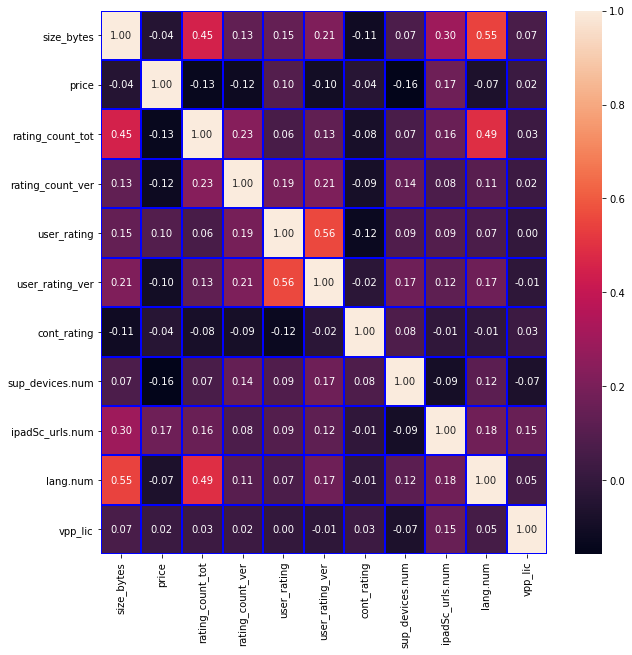

In [38]:
plt.subplots(figsize=(10,10))
sns.heatmap(data1.corr(), annot=True, linewidths=1,linecolor="blue", fmt=".2f")
plt.show()

In [64]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline


In [75]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
for col in df_km.columns:
    df_km[col] = labelencoder.fit_transform(df_km[col]) #Processing categorical data to numerical data
    
df_km.head(10)


,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,sup_devices.num,ipadSc_urls.num,lang.num
1,155,0,158,23,6,6,141,0,4,5,21
27,172,0,156,22,5,9,46,0,4,5,21
126,90,3,117,14,6,8,43,0,4,5,25
132,149,0,48,2,7,9,143,0,4,5,12
134,86,10,83,4,6,9,107,0,4,4,12
184,112,8,87,29,6,8,129,0,4,5,19
194,158,0,152,15,5,5,126,0,4,5,18
242,81,1,90,20,5,4,6,0,5,1,0
267,71,10,46,3,6,9,93,0,5,5,1
311,17,2,59,27,6,7,30,0,6,0,0


In [76]:
import seaborn as sns
import matplotlib 
import matplotlib.pyplot as plt
import pylab as pl

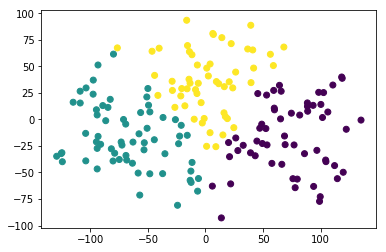

In [78]:
from sklearn.cluster import KMeans
kmeans_model = KMeans(n_clusters=3)
good_columns = df_km._get_numeric_data().dropna(axis=1)
kmeans_model.fit(good_columns)
labels = kmeans_model.labels_
from sklearn.decomposition import PCA
pca_2 = PCA(2)
plot_columns = pca_2.fit_transform(good_columns)
plt.scatter(x=plot_columns[:,0], y=plot_columns[:,1], c=labels)
plt.show()

In [ ]:
# Visualising the Random Forest Regression results (higher resolution)
X_grid = np.arange(min(X), max(X), 0.01)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, y, color = 'red')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.title('Truth or Bluff (Random Forest Regression)')
plt.xlabel('Position level')
plt.ylabel('Salary')
plt.show()